<a href="https://colab.research.google.com/github/IhratPramudya/Machine-Learning/blob/main/Tugas_Akhir_Machine_Learning_ipyn_DWBI_revisi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [263]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

penjualan = pd.read_csv('drive/MyDrive/DATASET/TADWBI.csv')

penjualan

,id_penjualan,tanggal,Propinsi,qty,vol_ml,nama_barang,total,nama_kurir,srv_lvl
0,4576,3-Jan-19,Banten,1,10,Basil,69000,JNE REG,Reg
1,4600,5-Jan-19,Banten,1,20,Lemongrass,99900,J&T CASHLESS,Exp
2,4600,5-Jan-19,Banten,1,20,Gurjun,28900,J&T CASHLESS,Exp
3,4600,5-Jan-19,Banten,1,10,Ylang Ylang,90500,J&T CASHLESS,Exp
4,4613,6-Jan-19,DKI Jakarta,2,1000,Cajuput,2107000,JNE REG,Reg
...,...,...,...,...,...,...,...,...,...
16263,8165,26-Jun-19,Jawa Barat,1,20,Ginger,187500,J&T CASHLESS,Exp
16264,8179,26-Jun-19,Jawa Barat,1,1000,Rosemary,2787500,JNE YES,Reg
16265,8179,26-Jun-19,Jawa Barat,1,500,Rosemary,1469000,JNE YES,Reg
16266,8203,27-Jun-19,Sumatera Utara,1,100,Olive,198000,JNE REG,Reg


In [264]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [265]:
penjualan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16268 entries, 0 to 16267
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id_penjualan  16268 non-null  int64 
 1   tanggal       16268 non-null  object
 2   Propinsi      16268 non-null  object
 3   qty           16268 non-null  int64 
 4   vol_ml        16268 non-null  int64 
 5   nama_barang   16268 non-null  object
 6   total         16268 non-null  int64 
 7   nama_kurir    16268 non-null  object
 8   srv_lvl       16268 non-null  object
dtypes: int64(4), object(5)
memory usage: 1.1+ MB


In [266]:
penjualan = penjualan.dropna()

print("Total data angka setelah menghapus nilai bariss missing values", len(penjualan))

Total data angka setelah menghapus nilai bariss missing values 16268


In [267]:
penjualan.describe()

,id_penjualan,qty,vol_ml,total
count,16268.000000,16268.000000,16268.000000,1.626800e+04
mean,11068.337657,1.065220,19.523051,1.453428e+05
std,4147.034209,0.434412,55.051662,4.337966e+05
min,4521.000000,1.000000,1.000000,0.000000e+00
25%,7330.000000,1.000000,10.000000,8.650000e+04
50%,10810.000000,1.000000,10.000000,1.025000e+05
75%,14557.500000,1.000000,10.000000,1.359000e+05
max,18776.000000,30.000000,1000.000000,4.771200e+07


In [268]:
drop_label = ['tanggal', 'vol_ml', 'srv_lvl', 'qty', 'id_penjualan','nama_barang', 'total']

penjualan.drop(drop_label, inplace=True, axis=1)


penjualan

,Propinsi,nama_kurir
0,Banten,JNE REG
1,Banten,J&T CASHLESS
2,Banten,J&T CASHLESS
3,Banten,J&T CASHLESS
4,DKI Jakarta,JNE REG
...,...,...
16263,Jawa Barat,J&T CASHLESS
16264,Jawa Barat,JNE YES
16265,Jawa Barat,JNE YES
16266,Sumatera Utara,JNE REG


In [270]:
from pandas.core.algorithms import unique
from sklearn import preprocessing

from sklearn.preprocessing import LabelEncoder

label_encoder = preprocessing.LabelEncoder()
le1 = label_encoder.fit(penjualan["Propinsi"])

print(list(label_encoder.classes_))
print()

len(list(label_encoder.classes_))

def get_integer_mapping(le):
    '''
    Return a dict mapping labels to their integer values
    from an SKlearn LabelEncoder
    le = a fitted SKlearn LabelEncoder
    '''
    res = {}
    for cl in le.classes_:
        res.update({cl:le.transform([cl])[0]})

    return res

integerMapping1 = get_integer_mapping(le1)


integerMapping1



['Bali', 'Bangka Belitung', 'Banten', 'Bengkulu', 'DKI Jakarta', 'Daerah Istimewa Yogyakarta', 'Gorontalo', 'Jambi', 'Jawa Barat', 'Jawa Tengah', 'Jawa Timur', 'Kalimantan Barat', 'Kalimantan Selatan', 'Kalimantan Tengah', 'Kalimantan Timur', 'Kalimantan Utara', 'Kepulauan Riau', 'Lampung', 'Maluku', 'Maluku Utara', 'Nanggroe Aceh Darussalam', 'Nusa Tenggara Barat', 'Nusa Tenggara Timur', 'Papua', 'Papua Barat', 'Riau', 'Sulawesi Barat', 'Sulawesi Selatan', 'Sulawesi Tengah', 'Sulawesi Tenggara', 'Sulawesi Utara', 'Sumatera Barat', 'Sumatera Selatan', 'Sumatera Utara']



{'Bali': 0,
 'Bangka Belitung': 1,
 'Banten': 2,
 'Bengkulu': 3,
 'DKI Jakarta': 4,
 'Daerah Istimewa Yogyakarta': 5,
 'Gorontalo': 6,
 'Jambi': 7,
 'Jawa Barat': 8,
 'Jawa Tengah': 9,
 'Jawa Timur': 10,
 'Kalimantan Barat': 11,
 'Kalimantan Selatan': 12,
 'Kalimantan Tengah': 13,
 'Kalimantan Timur': 14,
 'Kalimantan Utara': 15,
 'Kepulauan Riau': 16,
 'Lampung': 17,
 'Maluku': 18,
 'Maluku Utara': 19,
 'Nanggroe Aceh Darussalam': 20,
 'Nusa Tenggara Barat': 21,
 'Nusa Tenggara Timur': 22,
 'Papua': 23,
 'Papua Barat': 24,
 'Riau': 25,
 'Sulawesi Barat': 26,
 'Sulawesi Selatan': 27,
 'Sulawesi Tengah': 28,
 'Sulawesi Tenggara': 29,
 'Sulawesi Utara': 30,
 'Sumatera Barat': 31,
 'Sumatera Selatan': 32,
 'Sumatera Utara': 33}

In [271]:
le2 =label_encoder.fit(penjualan["nama_kurir"])

print(list(label_encoder.classes_))
print()

len(list(label_encoder.classes_))


def get_integer_mapping(le):
    '''
    Return a dict mapping labels to their integer values
    from an SKlearn LabelEncoder
    le = a fitted SKlearn LabelEncoder
    '''
    res = {}
    for cl in le.classes_:
        res.update({cl:le.transform([cl])[0]})

    return res

integerMapping2 = get_integer_mapping(le2)
integerMapping2

['ANTER AJA', 'GOJEK', 'GRAB', 'ID EXPRESS', 'J&T CASHLESS', 'J&T REG', 'JNE CASHLESS', 'JNE OKE', 'JNE REG', 'JNE YES', 'JOB', 'LAZADA EXP', 'LION PARSEL', 'NINJA', 'PAXEL', 'SHOPEE EXP', 'SI CEPAT HALU', 'SI CPT BEST', 'SI CPT REG']



{'ANTER AJA': 0,
 'GOJEK': 1,
 'GRAB': 2,
 'ID EXPRESS': 3,
 'J&T CASHLESS': 4,
 'J&T REG': 5,
 'JNE CASHLESS': 6,
 'JNE OKE': 7,
 'JNE REG': 8,
 'JNE YES': 9,
 'JOB': 10,
 'LAZADA EXP': 11,
 'LION PARSEL': 12,
 'NINJA': 13,
 'PAXEL': 14,
 'SHOPEE EXP': 15,
 'SI CEPAT HALU': 16,
 'SI CPT BEST': 17,
 'SI CPT REG': 18}

In [272]:
label1 = le1.fit_transform(penjualan["Propinsi"])
label2 = le2.fit_transform(penjualan["nama_kurir"])

penjualan["Propinsi"] = label1
penjualan["nama_kurir"] = label2


In [273]:
penjualan

,Propinsi,nama_kurir
0,2,8
1,2,4
2,2,4
3,2,4
4,4,8
...,...,...
16263,8,4
16264,8,9
16265,8,9
16266,33,8


In [253]:
# from sklearn.preprocessing import MinMaxScaler


# column = 'Propinsi'
# column2 = 'nama_kurir'

# min_value = min(penjualan[column])
# max_value = max(penjualan[column])

# min_value2 = min(penjualan[column2])
# max_value2 = max(penjualan[column2])

# penjualan[column] =  (penjualan[column] - min_value) / (max_value - min_value)
# penjualan[column2] =  (penjualan[column2] - min_value2) / (max_value2 - min_value2)

# display(penjualan)

# features = penjualan[["Propinsi", "nama_kurir"]]

# # Membuat objek MinMaxScaler
# scaler = MinMaxScaler()

# # Melakukan normalisasi data
# normalized_features = scaler.fit_transform(features)

# # Mengganti nilai pada kolom "Total Penduduk" dengan data yang telah dinormalisasi
# penjualan['Propinsi'] = normalized_features
# penjualan['nama_kurir'] = normalized_features

# # Menampilkan data setelah normalisasi
# print(penjualan.head())

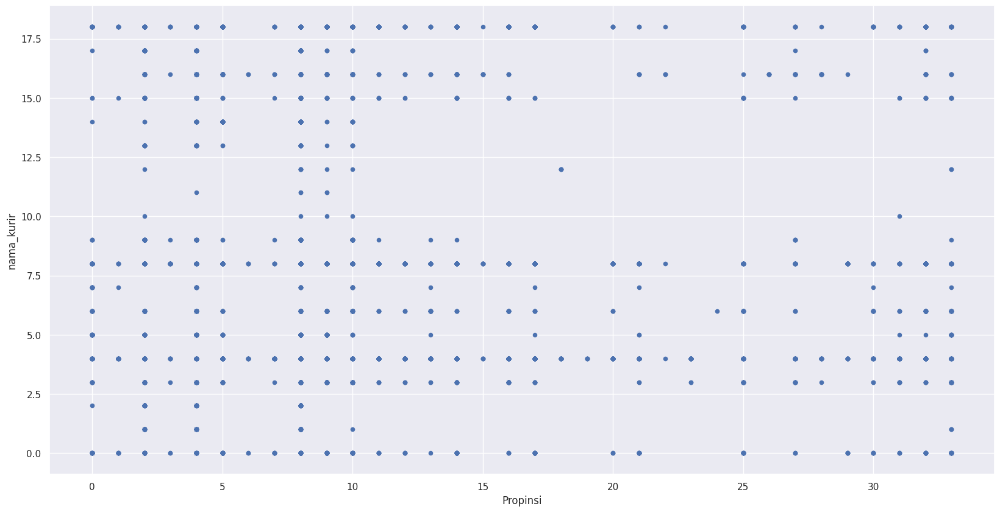

In [274]:
penjualan1 = penjualan[["Propinsi", "nama_kurir"]]

penjualan1.plot(kind="scatter", x="Propinsi", y="nama_kurir", figsize=(20,10))

plt.show()

In [275]:
from sklearn.cluster import KMeans
clusters = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(penjualan)
    clusters.append(km.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Text(0, 0.5, 'Inertia')

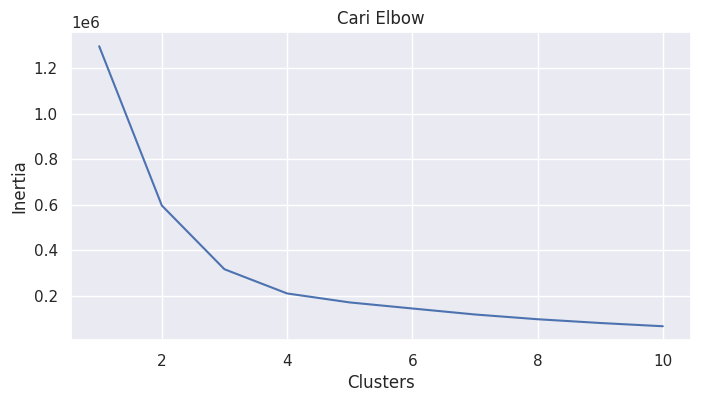

In [276]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# membuat plot inertia
fig, ax = plt.subplots(figsize=(8, 4))
sns.lineplot(x=list(range(1, 11)), y=clusters, ax=ax)
ax.set_title('Cari Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')

In [257]:

# # Menentukan jumlah kluster yang diinginkan
# n_clusters = 3

# # Membuat objek KMeans dengan jumlah kluster yang ditentukan
# kmeans = KMeans(n_clusters=n_clusters)

# # Melakukan pelatihan model KMeans
# kmeans.fit(penjualan)

# # Memprediksi label kluster untuk setiap data
# labels = kmeans.predict(penjualan)

# # Menambahkan kolom label kluster ke dalam DataFrame
# penjualan['Cluster'] = labels

# # Menampilkan data klaster
# print(penjualan.head())

# # Memplot data klaster
# plt.scatter(penjualan['Propinsi'], penjualan['nama_kurir'], c=labels)
# plt.xlabel('Propinsi')
# plt.ylabel('nama_kurir')
# plt.title('Klaster Data berdasarkan nama kurir')
# plt.show()

[[ 2  8]
 [ 2  4]
 [ 2  4]
 ...
 [ 8  9]
 [33  8]
 [10  4]]


Text(0, 0.5, 'nama_kurir')

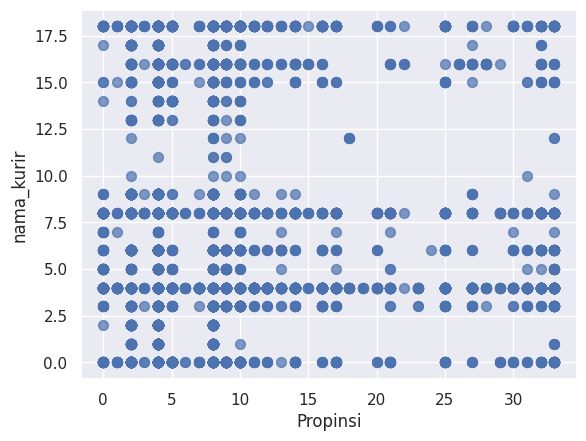

In [277]:
points = penjualan.iloc[:, 0:2].values
print(points)
x = points[:, 0]
y = points[:, 1]

plt.scatter(x, y, s=50, alpha=0.7)
plt.xlabel('Propinsi')
plt.ylabel('nama_kurir')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


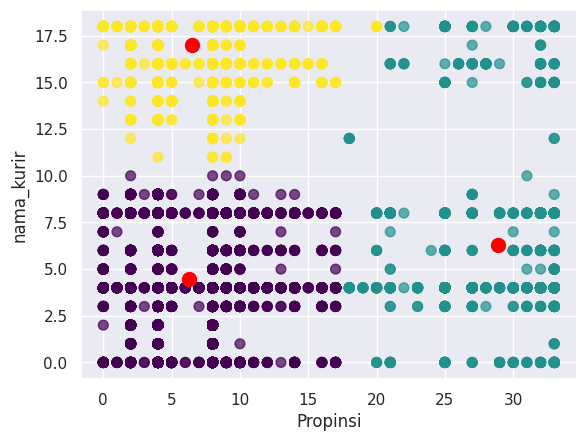

In [278]:
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(points)
predicted_cluster_indexes = kmeans.predict(points)

plt.scatter(x, y, c=predicted_cluster_indexes, s=50, alpha=0.7, cmap='viridis')
plt.xlabel('Propinsi')
plt.ylabel('nama_kurir')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100)

In [279]:
df = penjualan.copy()
df['Cluster'] = kmeans.predict(points)
df


,Propinsi,nama_kurir,Cluster
0,2,8,0
1,2,4,0
2,2,4,0
3,2,4,0
4,4,8,0
...,...,...,...
16263,8,4,0
16264,8,9,0
16265,8,9,0
16266,33,8,1
